# Exploracion

## 1. Exploracion y analisis de datos

In [1]:
import pandas as pd
import numpy as np
import numpy as np
import re
import seaborn as sns
from scipy import stats
import math
import operator
import plotly
import plotly.plotly as py
import plotly.tools as tls
import plotly.graph_objs as go
from plotly.graph_objs import *
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.figure_factory as ff#visualization
from plotly.offline import *

%matplotlib inline
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = 10, 10
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNetCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score


In [2]:
df = pd.read_csv('df_alumnos.csv', index_col='persona')
df.sample(1)

,alumno,dias_inscripcion,cant_cambios_plan,cant_inasistencias,cant_inscr_fuera_termino,cant_dias_inscripcion_ult_plan,promedio,cant_aprobados,cant_desaprobados,costeo_estudios_beca,...,trabajo_existe_padre,trabajo_hace_padre,trabajo_existe_alumno,cant_reg_alumnos,cant_inscr_examenes,cant_dias_inscripcion_ult_examen,estudio_alcanzado_tutor,unido_hecho,desercion,promedio_tiempo_insc_examen
persona,,,,,,,,,,,,,,,,,,,,,
556551,681265,77,1,NaN,NaN,3528,3.14,3.0,4.0,N,...,NaN,NaN,NaN,1,20.0,2477.0,NaN,0.0,0,0.967923


#### Reemplazo todas las S y N por integer 1 y 0

In [3]:
df = df.replace('S',1)
df = df.replace('N',0)
df.sample(1)

,alumno,dias_inscripcion,cant_cambios_plan,cant_inasistencias,cant_inscr_fuera_termino,cant_dias_inscripcion_ult_plan,promedio,cant_aprobados,cant_desaprobados,costeo_estudios_beca,...,trabajo_existe_padre,trabajo_hace_padre,trabajo_existe_alumno,cant_reg_alumnos,cant_inscr_examenes,cant_dias_inscripcion_ult_examen,estudio_alcanzado_tutor,unido_hecho,desercion,promedio_tiempo_insc_examen
persona,,,,,,,,,,,,,,,,,,,,,
294162,393091,183,1,NaN,NaN,608,2.0,NaN,2.0,0.0,...,1.0,2.0,NaN,1,3.0,60.0,NaN,0.0,0,0.606275


#### Llevo todo lo que sea string a lowercase

In [4]:
df = df.applymap(lambda s:s.lower() if type(s) == str else s)
df.sample(1)

,alumno,dias_inscripcion,cant_cambios_plan,cant_inasistencias,cant_inscr_fuera_termino,cant_dias_inscripcion_ult_plan,promedio,cant_aprobados,cant_desaprobados,costeo_estudios_beca,...,trabajo_existe_padre,trabajo_hace_padre,trabajo_existe_alumno,cant_reg_alumnos,cant_inscr_examenes,cant_dias_inscripcion_ult_examen,estudio_alcanzado_tutor,unido_hecho,desercion,promedio_tiempo_insc_examen
persona,,,,,,,,,,,,,,,,,,,,,
40352,43905,3442,1,NaN,NaN,5726,6.42,27.0,4.0,0.0,...,NaN,NaN,NaN,2,45.0,2118.0,NaN,0.0,0,0.893361


In [5]:
df.describe()

,alumno,dias_inscripcion,cant_cambios_plan,cant_inasistencias,cant_inscr_fuera_termino,cant_dias_inscripcion_ult_plan,promedio,cant_aprobados,cant_desaprobados,costeo_estudios_beca,...,trabajo_existe_padre,trabajo_hace_padre,trabajo_existe_alumno,cant_reg_alumnos,cant_inscr_examenes,cant_dias_inscripcion_ult_examen,estudio_alcanzado_tutor,unido_hecho,desercion,promedio_tiempo_insc_examen
count,1.943550e+05,194355.000000,194355.000000,46682.000000,12272.000000,194355.000000,194355.000000,182014.000000,136454.000000,177222.000000,...,38058.000000,30263.000000,74250.000000,194355.000000,193304.000000,193304.000000,9.000000,194354.000000,194355.000000,191458.000000
mean,4.622268e+05,667.804656,1.086496,35.632664,2.274364,2949.147925,5.446506,13.465854,5.407720,0.030250,...,1.453939,2.390510,1.001737,1.581024,32.002581,1481.543708,6.111111,0.069183,0.153981,0.886903
std,2.935826e+05,860.929469,0.281700,78.878833,2.087040,1768.092585,1.841226,13.412604,6.095308,0.171275,...,1.011012,0.772199,0.058348,0.873942,30.666336,1517.655721,3.887301,0.253766,0.360932,0.135517
min,4.848000e+03,41.000000,1.000000,0.000000,1.000000,61.000000,0.000000,1.000000,1.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,26.000000,1.000000,0.000000,0.000000,0.259143
25%,1.618090e+05,141.000000,1.000000,2.000000,1.000000,1349.000000,4.030000,3.000000,2.000000,0.000000,...,1.000000,2.000000,1.000000,1.000000,8.000000,174.000000,3.000000,0.000000,0.000000,0.819388
50%,4.479830e+05,271.000000,1.000000,5.000000,1.000000,2806.000000,5.370000,7.000000,3.000000,0.000000,...,1.000000,3.000000,1.000000,1.000000,23.000000,905.000000,5.000000,0.000000,0.000000,0.948066
75%,7.058555e+05,847.000000,1.000000,13.000000,2.000000,4206.000000,6.860000,23.000000,7.000000,0.000000,...,1.000000,3.000000,1.000000,2.000000,48.000000,2584.000000,10.000000,0.000000,0.000000,0.990271
max,1.001664e+06,6458.000000,3.000000,501.000000,17.000000,30109.000000,10.000000,60.000000,98.000000,1.000000,...,4.000000,4.000000,3.000000,16.000000,536.000000,6986.000000,11.000000,1.000000,1.000000,1.000000


### Graficar nulos

#### Credenciales plotly

In [6]:
plotly.tools.set_credentials_file(username='darosk88', api_key='o4Knn6HIJlzubv9dYgDw')

#### Grafico de barras de nulos con plotly

In [7]:
def nulls_plot(df):
    columns  = df.columns
    nullcount = df[columns].isnull().sum()
    notnullcount = df[columns].notnull().sum()
    fig = go.Figure(data=[
        go.Bar(name='Nulls', x=columns, y=nullcount),
        go.Bar(name='NotNulls', x=columns, y=notnullcount)
    ])
    fig.layout.update(barmode='stack')
    return py.iplot(fig)

In [8]:
nulls_plot(df)

#### Elimino las columnas que tienen muchos nulos

Primero obtengo los porcentajes de nulos de aquellas columnas que superen el 25% de nulos

In [9]:
def get_columns_by_null_percentage(df,percentage):
    columns  = df.columns
    nulls_in_serie = df[columns].isnull().sum()
    mask_nulls_by_perc = nulls_in_serie/len(df) > percentage
    nulls_by_perc = mask_nulls_by_perc.where(mask_nulls_by_perc == True)
    return nulls_by_perc.dropna()

##### Selecciono las columnas a eliminar

In [10]:
nulls_to_drop = get_columns_by_null_percentage(df,0.60)
columns_to_drop = nulls_to_drop.index
columns_to_drop

Index(['cant_inasistencias', 'cant_inscr_fuera_termino', 'trabajo_hace',
       'trabajo_carrera', 'estudio_alcanzado_padre', 'estudio_alcanzado_madre',
       'trabajo_existe_madre', 'trabajo_hace_madre', 'trabajo_existe_padre',
       'trabajo_hace_padre', 'trabajo_existe_alumno',
       'estudio_alcanzado_tutor'],
      dtype='object')

##### Elimino las columnas seleccionadas anteriormente

In [11]:
df.drop(columns=columns_to_drop, inplace=True)

Vuelvo a graficar los nulos

In [12]:
nulls_plot(df)

***

## Matriz de Correlaciones
Trabajo con correlaciones para quedarme con las columnas que tienen mayor correlacion

In [13]:
def corr_graph(df_in, filename, method='pearson'):
    fig, ax = plt.subplots(figsize=(120,120))       
    sns.heatmap(df_in.corr(method) , square=True, annot=True, ax=ax);
    ax.set_title("Correlacion")
    plt.draw()
    plt.savefig("graph/"+filename+".jpg")
    plt.close('all')

In [14]:
corr_graph(df, 'corr_graph1')

### Obtener columnas con mayor correlacion
Correlacion mayor a 0.10

In [15]:
df_corr = df.corr()
df_max_corr = df_corr[df_corr['desercion'].abs() > 0.10]['desercion'].sort_values(ascending=True)
df_max_corr

cant_aprobados                     -0.224186
promedio                           -0.183858
tiene_pc_casa                      -0.169472
cant_inscr_examenes                -0.162686
tiene_internet_casa                -0.119089
deportes                           -0.105863
costeo_estudios_trabajo             0.105589
cant_reg_alumnos                    0.144989
cant_cambios_plan                   0.159681
cant_dias_inscripcion_ult_plan      0.161340
promedio_tiempo_insc_examen         0.234669
cant_dias_inscripcion_ult_examen    0.384662
desercion                           1.000000
Name: desercion, dtype: float64

#### Antes de comenzar a explorar en mas detalle elimino todas las variables que no tengan correlacion mayor a 0.10
Para ello primero voy a quedarme con esas variables y verificar sus nulos

df_max_corr contiene las variables con correlacion > 0.10

In [16]:
df = df[df_max_corr.index]
df.sample(1)

,cant_aprobados,promedio,tiene_pc_casa,cant_inscr_examenes,tiene_internet_casa,deportes,costeo_estudios_trabajo,cant_reg_alumnos,cant_cambios_plan,cant_dias_inscripcion_ult_plan,promedio_tiempo_insc_examen,cant_dias_inscripcion_ult_examen,desercion
persona,,,,,,,,,,,,,
427852,17.0,5.25,1.0,27.0,NaN,1.0,0.0,1,1,2443,0.546599,57.0,0


#### Porcentaje de nulos de mi set de datos resultante

In [17]:
nulls_plot(df)

#### La columna tiene_internet tiene correlacion baja y muchos nulos: la elimino ya que no puedo recuperar estos datos

In [18]:
df.drop(columns=['tiene_internet_casa'], inplace=True)

#### Nulos en desercion positiva
Lo que mas me importa es mantener la cantidad de datos que tengo con desercion, ya que cuento con menos cantidad de casos

In [19]:
nulls_plot(df[df.desercion == 1])

In [20]:
df[df.desercion == 1].isnull().sum().sum()

5069

#### Como la mayoria de los que esta en null tiene promedio 2: relleno con cantidad de aprobados = 0
Hago un update de cant_aprobados = 0 cuando sea desercion y este en nulo

In [21]:
mask_desercion_and_null_aprobados = (df.desercion == 1) & (df.cant_aprobados.isnull())
s_upd = df[mask_desercion_and_null_aprobados].cant_aprobados.fillna(0)
df.cant_aprobados.update(s_upd)

In [22]:
nulls_plot(df[df.desercion == 1])

<div class="alert alert-block alert-info">
<b>Decision:</b>
Ahora si elimino todos los nulos como mucho voy a perder aproximadamente 1500 registros de desercion
</div>

##### Borro todo lo que sea nulo

In [23]:
df.dropna(inplace = True)

In [24]:
nulls_plot(df)

#### Redondeo las columnas de promedios

In [25]:
s_upd = df.promedio_tiempo_insc_examen.round(4)
df.promedio_tiempo_insc_examen.update(s_upd)

s_upd_prom = df.promedio.round(4)
df.promedio.update(s_upd_prom)

#### Correlacion luego de limpiar nulos

In [26]:
corr_graph(df, 'corr_graph_spearman','spearman')

<div class="alert alert-block alert-success">
<b>Yay:</b>
Ahora si no hay nulos :). Let's begin
</div>

***

### Pie Charts Desercin vs No Deserción
De los datos que me quedaron vamos a graficar los desertores y no desertores

In [27]:
#labels
lab = df["desercion"].value_counts().keys().tolist()
lab = ['No Desercion','Desercion'] # paso 1 como regular 0 no regular
#values
val = df["desercion"].value_counts().values.tolist()

trace = go.Pie(labels = lab ,
               values = val ,
               marker = dict(colors =  [ 'mediumseagreen' ,'indianred'],
                             line = dict(color = "white",
                                         width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Casos de deserción",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )

data = [trace]
fig = go.Figure(data = data,layout = layout)
py.iplot(fig)

## Discretizando variables Numericas
Para poder graficar voy a discretizar las variables numericas

In [28]:
df.columns.tolist()

['cant_aprobados',
 'promedio',
 'tiene_pc_casa',
 'cant_inscr_examenes',
 'deportes',
 'costeo_estudios_trabajo',
 'cant_reg_alumnos',
 'cant_cambios_plan',
 'cant_dias_inscripcion_ult_plan',
 'promedio_tiempo_insc_examen',
 'cant_dias_inscripcion_ult_examen',
 'desercion']

### Histogramas: Distribucion de variables
Graficos de barra para visualizar como estan distribuidas las variables y decidir que tipo de corte realizar (media, quartil, quintil, decil)

In [29]:
def histogram1(variable, df, color, bins):
    fig = df[variable].hist(bins=bins, color=color)
    fig.set_xlabel(variable)
    fig.set_ylabel('Cantidad de Registros')
    fig.set_title('Distribución de '+variable)
    plt.draw()
    plt.savefig("graph/histogramas/"+variable+"_histogram1_"+str(bins)+".jpg")
    plt.clf()

Divido en una cantidad mayor a 10 para ver como se distribuye

In [30]:
histogram1('cant_aprobados', df, 'c', 12)
histogram1('promedio', df, 'c', 12)
histogram1('cant_inscr_examenes', df, 'c', 12)
histogram1('cant_reg_alumnos', df, 'c', 12)
histogram1('cant_dias_inscripcion_ult_plan', df, 'c', 12)
histogram1('promedio_tiempo_insc_examen', df, 'c', 12)
histogram1('cant_dias_inscripcion_ult_examen', df, 'c', 12)

<Figure size 432x288 with 0 Axes>

### Funcion para discretizar variables
    - Median 2
    - Quartil 4
    - Quintil 5
    - Decil 10

In [31]:
def make_discrete_df(variable, df, option=4):
    """Esta funcion toma una variable, df y opcion, y retorna el df original con la nueva variable discretizada
        Options:
        2 	= Median
        4 	= Quartiles
        5 	= Quintiles
        10 	= Deciles
    """
    opt = str(option)
    var = str(variable)
    var_discrete = var+'_discrete'+opt

    #Median
    if option == 2:
        median,bins = pd.qcut(df[var], option, labels=['0', '1'],retbins=True)
        labels = []
        for idx, val in enumerate(bins):
            if idx < option:
                label=str(bins[idx])+"-"+str(bins[idx+1])
                labels.append(label)
        median = pd.qcut(df[var], option, labels=labels)
        df.insert(loc=0, column=var_discrete, value=median)
    #Quartiles
    elif option == 4:
        quartiles,bins = pd.qcut(df[var], option, labels=['1', '2', '3', '4'],retbins=True)
        labels = []
        for idx, val in enumerate(bins):
            if idx < option:
                label=str(bins[idx])+"-"+str(bins[idx+1])
                labels.append(label)
        quartiles = pd.qcut(df[var], option, labels=labels)

        df.insert(loc=0, column=var_discrete, value=quartiles)
    elif option == 5:
        quintiles,bins = pd.qcut(df[var], option, labels=['1', '2', '3', '4','5'],retbins=True)
        labels = []
        for idx, val in enumerate(bins):
            if idx < option:
                label=str(bins[idx])+"-"+str(bins[idx+1])
                labels.append(label)
        quintiles = pd.qcut(df[var], option, labels=labels)
        df.insert(loc=0, column=var_discrete, value=quintiles)
    elif option == 10:
        deciles,bins = pd.qcut(df[var], option, labels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'],retbins=True)
        labels = []
        for idx, val in enumerate(bins):
            if idx < option:
                label=str(bins[idx])+"-"+str(bins[idx+1])
                labels.append(label)
        deciles = pd.qcut(df[var], option, labels=labels)
        df.insert(loc=0, column=var_discrete, value=deciles)
    return df

### Discretizando variables numericas en cuartil, quintil y/o decil
- Cantidad de Examenes Aprobados
- Promedios
- Cantidad de inscripciones a examenes
- Cantidad de dias de inscripcion al ultimo plan
- Tiempo promedio en inscripcion a ultimos 4 examenes
- Cantidad de dias inscripcion ultimo examen
- Cantidad de veces registrado como alumno

In [32]:
print(df.shape)
df = make_discrete_df('cant_aprobados', df, 5)
df = make_discrete_df('cant_aprobados', df, 10)

df = make_discrete_df('promedio', df, 5)
df = make_discrete_df('promedio', df, 10)

df = make_discrete_df('cant_inscr_examenes', df, 5)
df = make_discrete_df('cant_inscr_examenes', df, 10)

df = make_discrete_df('cant_dias_inscripcion_ult_plan', df, 5)
df = make_discrete_df('cant_dias_inscripcion_ult_plan', df, 10)

df = make_discrete_df('promedio_tiempo_insc_examen', df, 5)

df = make_discrete_df('cant_dias_inscripcion_ult_examen', df, 5)
df = make_discrete_df('cant_dias_inscripcion_ult_examen', df, 10)

# df = make_discrete_df('cant_reg_alumnos', df, 2)
print(df.shape)

(181733, 12)
(181733, 23)


***

### Graficos de barras para variables discretizadas

### Graficos de Barra

In [33]:
def bar(variable, df,title_barplot=""):
    fig =df.groupby(variable).size().plot(kind='bar',figsize=(20,12))
    fig.set_xlabel(variable)
    fig.set_ylabel('Cantidad de registros')
    fig.set_title(title_barplot)
    plt.draw()
    plt.savefig("graph/bar/"+variable+"_bar.jpg")
    plt.close('all')

#### Genero grafico de barras para las columnas discrete

In [34]:
for col in df.columns.tolist():
    if (col.__contains__("discrete")):
        tipo = "quartiles" if col.__contains__("4") else "quintiles" if col.__contains__("5") else "deciles"
        title_barplot = "Distribución por "+tipo+" para "+col
        bar(col,df,title_barplot)
        print("Barras generado: "+title_barplot)

Barras generado: Distribución por deciles para cant_dias_inscripcion_ult_examen_discrete10
Barras generado: Distribución por quintiles para cant_dias_inscripcion_ult_examen_discrete5
Barras generado: Distribución por quintiles para promedio_tiempo_insc_examen_discrete5
Barras generado: Distribución por deciles para cant_dias_inscripcion_ult_plan_discrete10
Barras generado: Distribución por quintiles para cant_dias_inscripcion_ult_plan_discrete5
Barras generado: Distribución por deciles para cant_inscr_examenes_discrete10
Barras generado: Distribución por quintiles para cant_inscr_examenes_discrete5
Barras generado: Distribución por deciles para promedio_discrete10
Barras generado: Distribución por quintiles para promedio_discrete5
Barras generado: Distribución por deciles para cant_aprobados_discrete10
Barras generado: Distribución por quintiles para cant_aprobados_discrete5


### Graficos para variables discretizadas vs desercion

### Pie Charts

#### Dividido dataframe en regular y no regular

In [35]:
df_desercion     = df[df["desercion"] == 1]
df_not_desercion = df[df["desercion"] == 0]

In [36]:
def plot_pie(column,df_desercion,df_not_desercion):
    trace1 = go.Pie(values  = df_desercion[column].value_counts().values.tolist(),
                    labels  = df_desercion[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [0,.48]),
                    name    = "Sin desercion",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    hole    = .6
                   )
    trace2 = go.Pie(values  = df_not_desercion[column].value_counts().values.tolist(),
                    labels  = df_not_desercion[column].value_counts().keys().tolist(),
                    hoverinfo = "label+percent+name",
                    marker  = dict(line = dict(width = 2,
                                               color = "rgb(243,243,243)")
                                  ),
                    domain  = dict(x = [.52,1]),
                    hole    = .6,
                    name    = "Desercion" 
                   )
    layout = go.Layout(dict(title = column + " distribucion de alumnos con desercion",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            annotations = [dict(text = "Sin desercion",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .20, y = .5),
                                           dict(text = "Con desercion",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .82,y = .5
                                               )
                                          ]
                           )
                      )
    data = [trace1,trace2]
    fig  = go.Figure(data = data,layout = layout)
    return fig
    py.iplot(fig)

In [37]:
# graph = plot_pie('promedio_tiempo_insc_examen_discrete5',df_desercion,df_not_desercion)
# py.iplot(graph)

In [38]:
# graph = plot_pie('cant_dias_inscripcion_ult_examen_discrete4',df_desercion,df_not_desercion)
# py.iplot(graph)

In [39]:
# graph = plot_pie('tiene_pc_casa',df_desercion,df_not_desercion)
# py.iplot(graph)

In [40]:
# graph = plot_pie('cant_aprobados_discrete2',df_desercion,df_not_desercion)
# py.iplot(graph)

In [41]:
# graph = plot_pie('cant_aprobados_discrete4',df_desercion,df_not_desercion)
# py.iplot(graph)

In [42]:
df.sample(1)

,cant_dias_inscripcion_ult_examen_discrete10,cant_dias_inscripcion_ult_examen_discrete5,promedio_tiempo_insc_examen_discrete5,cant_dias_inscripcion_ult_plan_discrete10,cant_dias_inscripcion_ult_plan_discrete5,cant_inscr_examenes_discrete10,cant_inscr_examenes_discrete5,promedio_discrete10,promedio_discrete5,cant_aprobados_discrete10,...,tiene_pc_casa,cant_inscr_examenes,deportes,costeo_estudios_trabajo,cant_reg_alumnos,cant_cambios_plan,cant_dias_inscripcion_ult_plan,promedio_tiempo_insc_examen,cant_dias_inscripcion_ult_examen,desercion
persona,,,,,,,,,,,,,,,,,,,,,
719120,905.0-1489.0,397.0-1489.0,0.7756-0.9102,3903.0-4621.0,3211.0-4621.0,74.0-467.0,56.0-467.0,4.0-4.6,4.0-5.0,36.0-60.0,...,1.0,83.0,0.0,1.0,2,1,4548,0.8837,1352.0,0


## Pair Plots
Muestra histogramas y scatter plots entre variables

In [56]:
df_scatter = df[
    ['cant_aprobados',
     'promedio',
     'cant_inscr_examenes',
     'cant_reg_alumnos',
     'cant_cambios_plan',
     'cant_dias_inscripcion_ult_plan',
     'promedio_tiempo_insc_examen',
     'cant_dias_inscripcion_ult_examen',
     'desercion'
    ]
]

g = sns.PairGrid(df_scatter, hue="desercion",height=12)
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend()
g.savefig("graph/scatterPairGrid.jpg")

In [58]:
df_scatter = df[
    ['cant_aprobados',
     'promedio',
     'cant_inscr_examenes',
     'cant_reg_alumnos',
     'cant_cambios_plan',
     'cant_dias_inscripcion_ult_plan',
     'promedio_tiempo_insc_examen',
     'cant_dias_inscripcion_ult_examen',
     'tiene_pc_casa'    
    ]
]

g = sns.PairGrid(df_scatter, hue="tiene_pc_casa",height=12)
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend()
g.savefig("graph/scatterPairGrid2.jpg")

#### Scatter plot

In [46]:
def scatter_sns(df,xcol,ycol,target,filename="svm_conf"):
    df_scatter = df[[xcol,ycol,target]]
    sns.set(style="whitegrid")
    f, ax = plt.subplots(figsize=(20, 20))
    sns.despine(f, left=True, bottom=True)
    order = df_scatter[target].value_counts().keys().tolist()
    sct = sns.scatterplot(x=xcol, y=ycol,
                    hue=target,
                    palette="colorblind",
                    hue_order=order,
                    linewidth=0,
                    data=df_scatter, ax=ax)

    figure = sct.get_figure()    
    figure.savefig('graph/'+filename+'.png', dpi=400)
    

#### Scatter Plot: Aprobados vs tiempo promedio de inscripcion a examenes

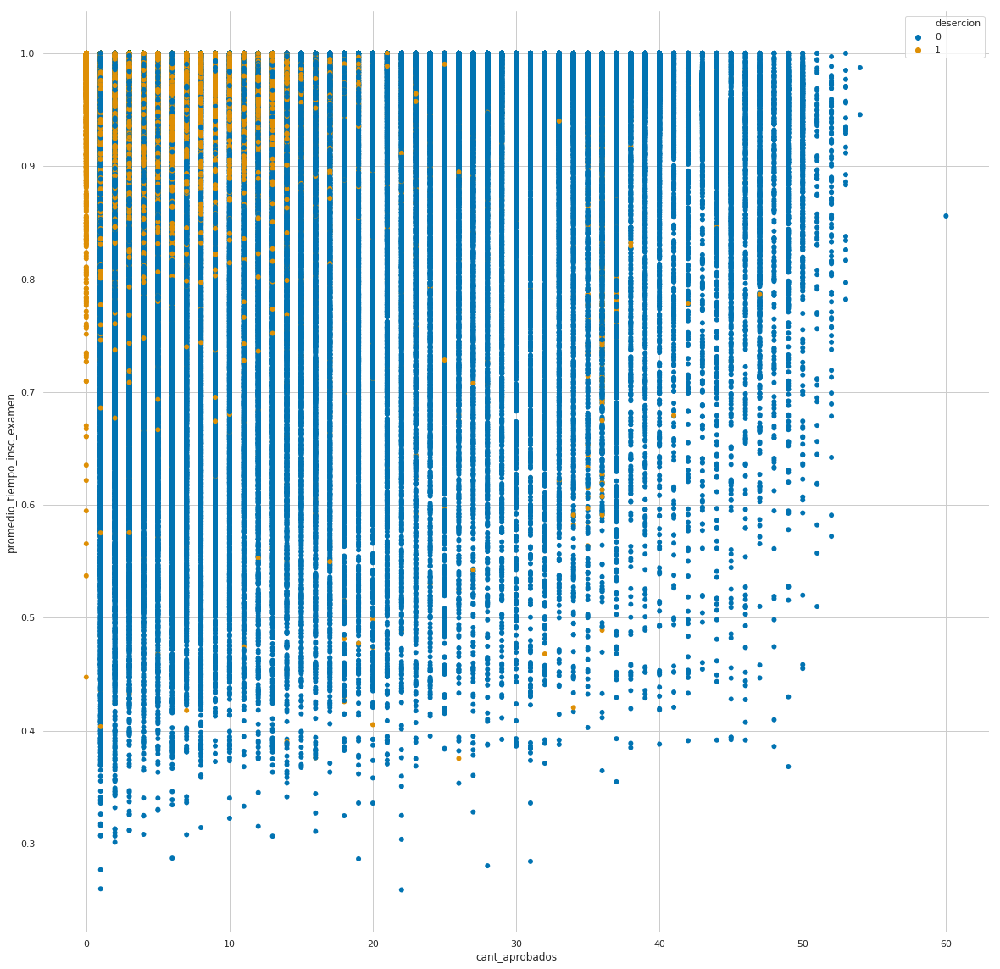

In [47]:
scatter_sns(df,"cant_aprobados","promedio_tiempo_insc_examen","desercion","scater_aprobados_vs_tiempo")

#### Scatter Plot: Aprobados vs Promedio

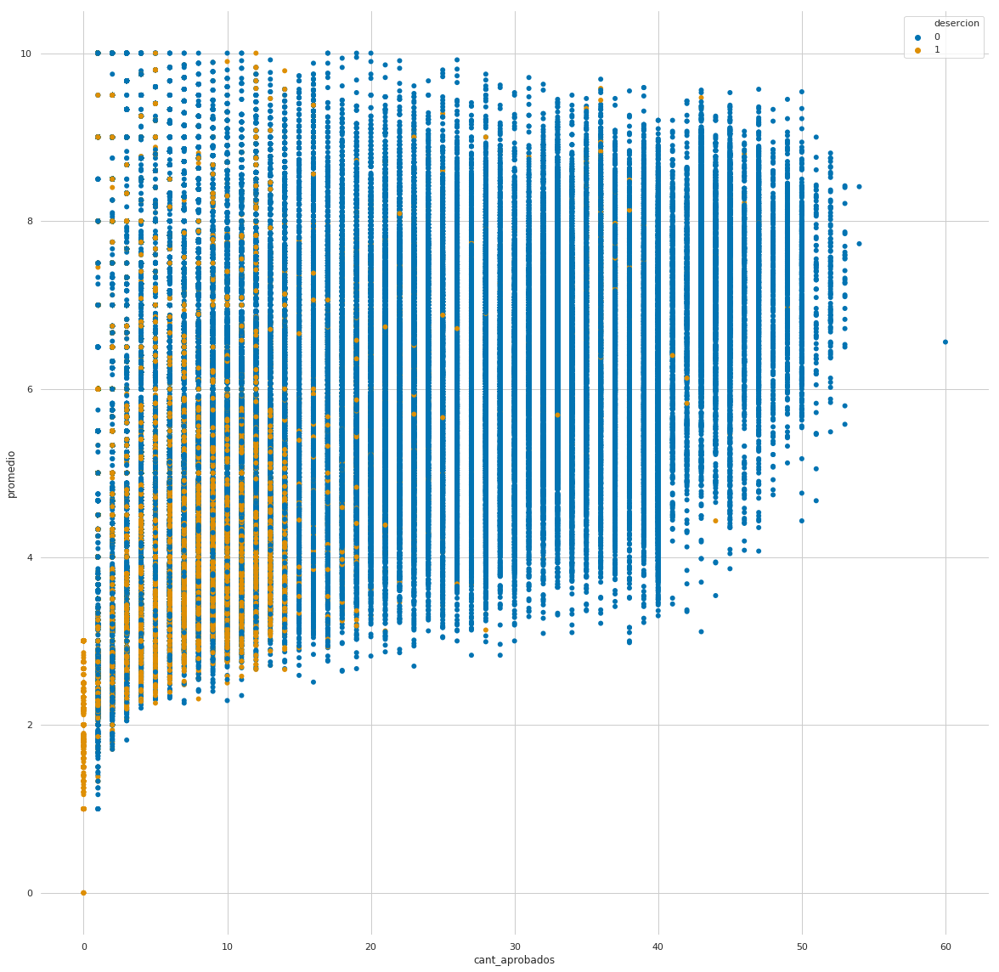

In [48]:
scatter_sns(df,"cant_aprobados","promedio","desercion","scater_aprobados_vs_promedio")

#### Scatter Plot: Aprobados vs Cantidad de dias desde la inscripcion al ultimo examen

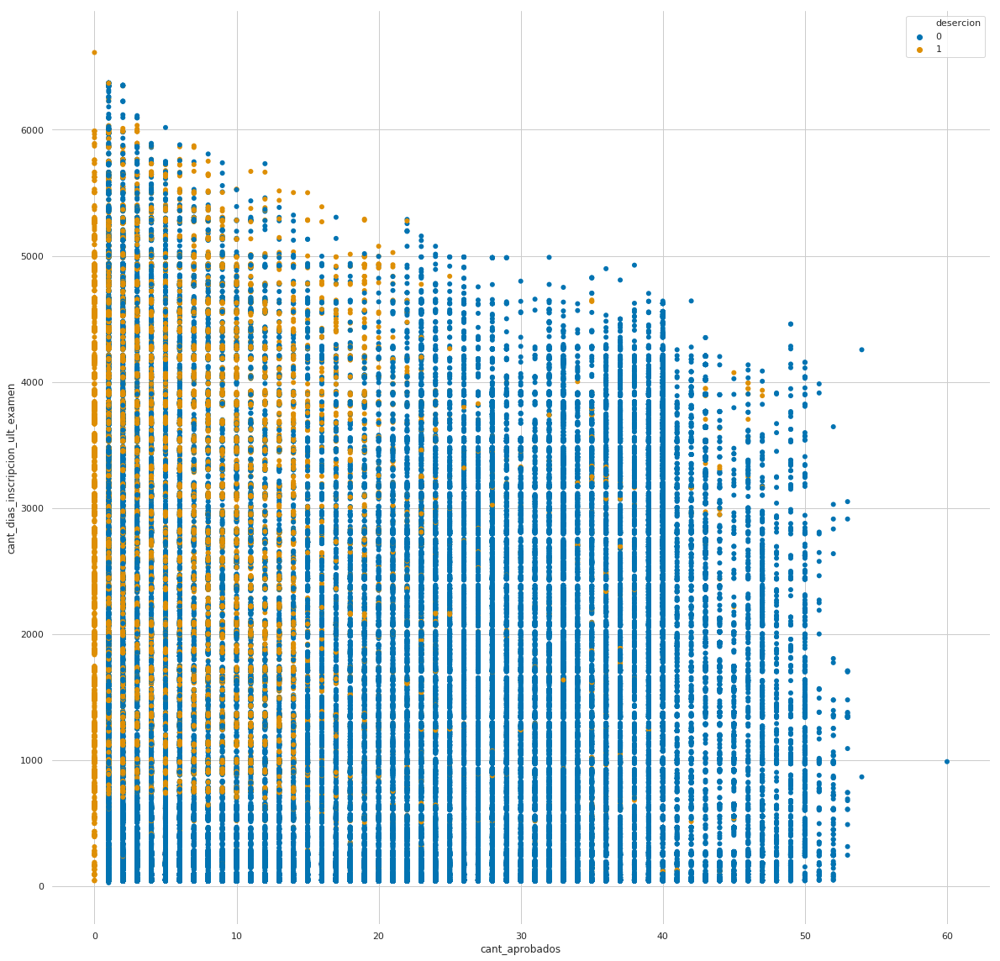

In [49]:
scatter_sns(df,"cant_aprobados","cant_dias_inscripcion_ult_examen","desercion","scater_cantdiasinscultex_vs_promedio")

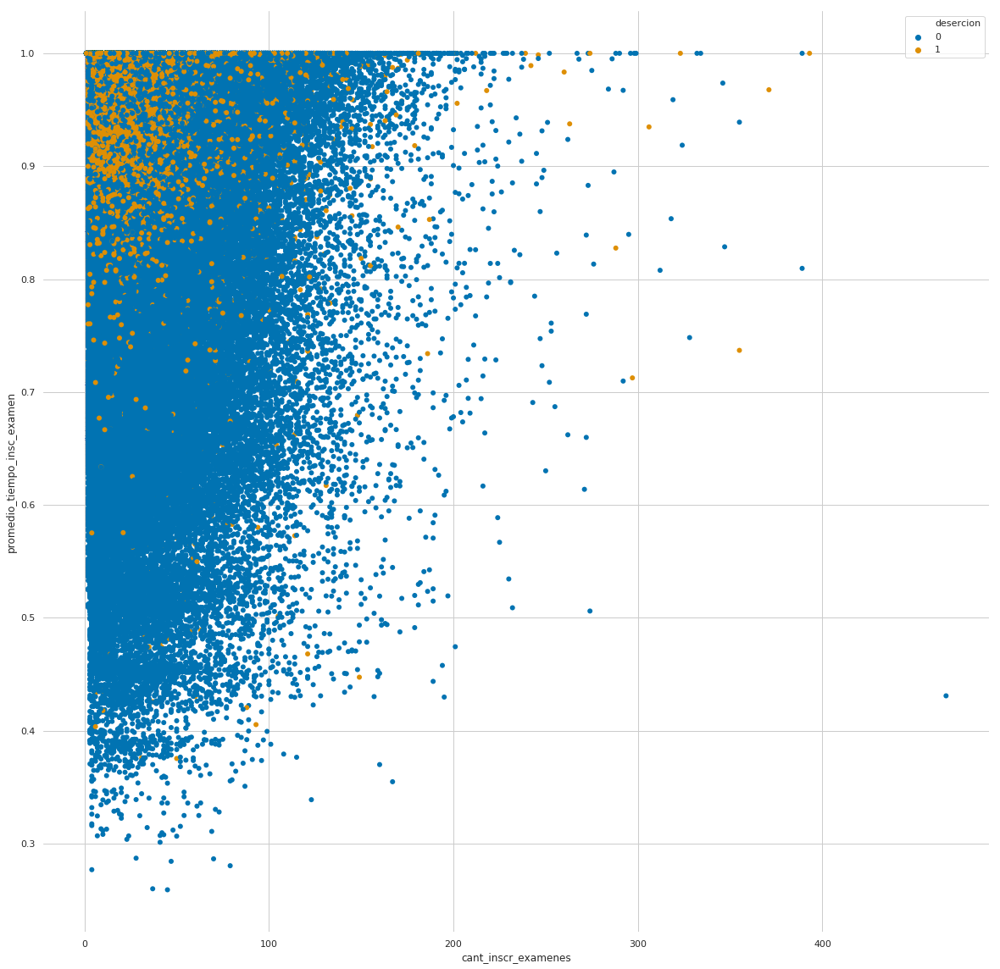

In [50]:
scatter_sns(df,"cant_inscr_examenes","promedio_tiempo_insc_examen","desercion","scater_cantinscrex_vs_tiempo")

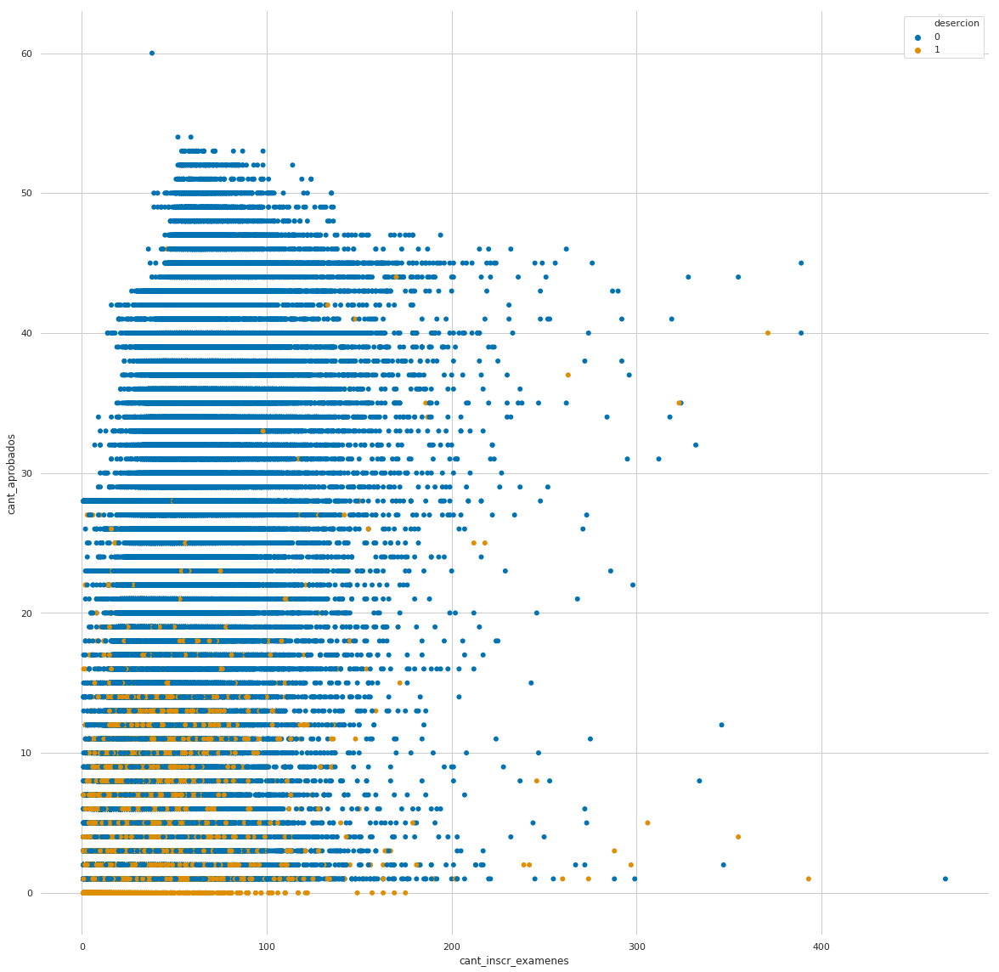

In [51]:
scatter_sns(df,"cant_inscr_examenes","cant_aprobados","desercion","scater_cantinscrex_vs_hacedep")

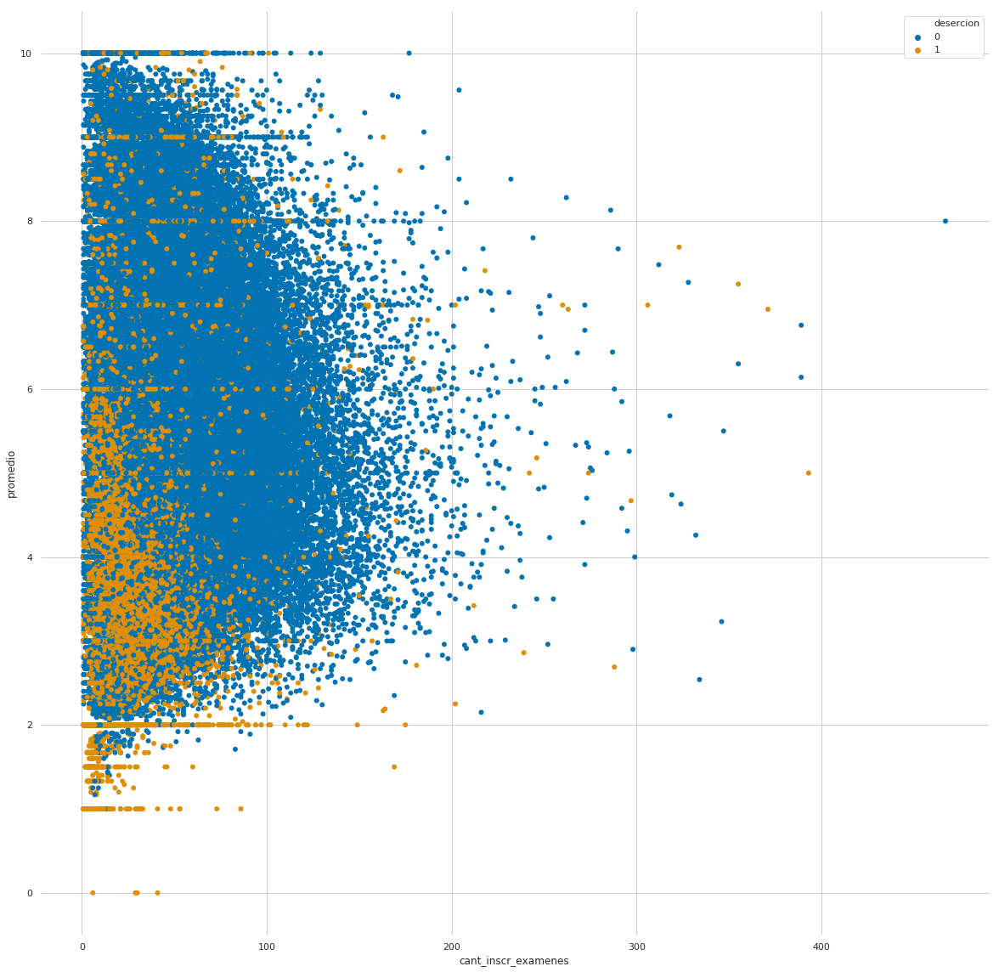

In [68]:
scatter_sns(df,"cant_inscr_examenes","promedio","desercion","scater_cantinsc_vs_promedio_desercion")

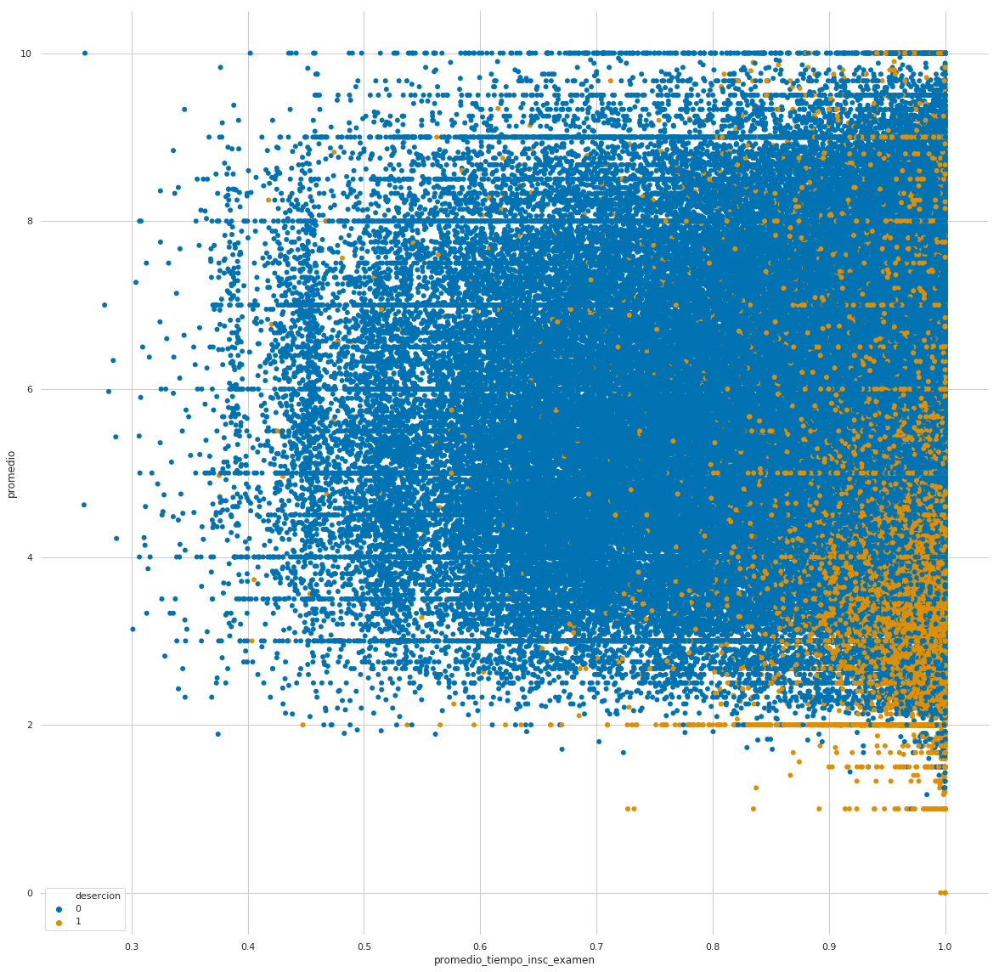

In [67]:
scatter_sns(df,"promedio_tiempo_insc_examen","promedio","desercion","scater_tiempoprominsc_vs_promedio_desercion")

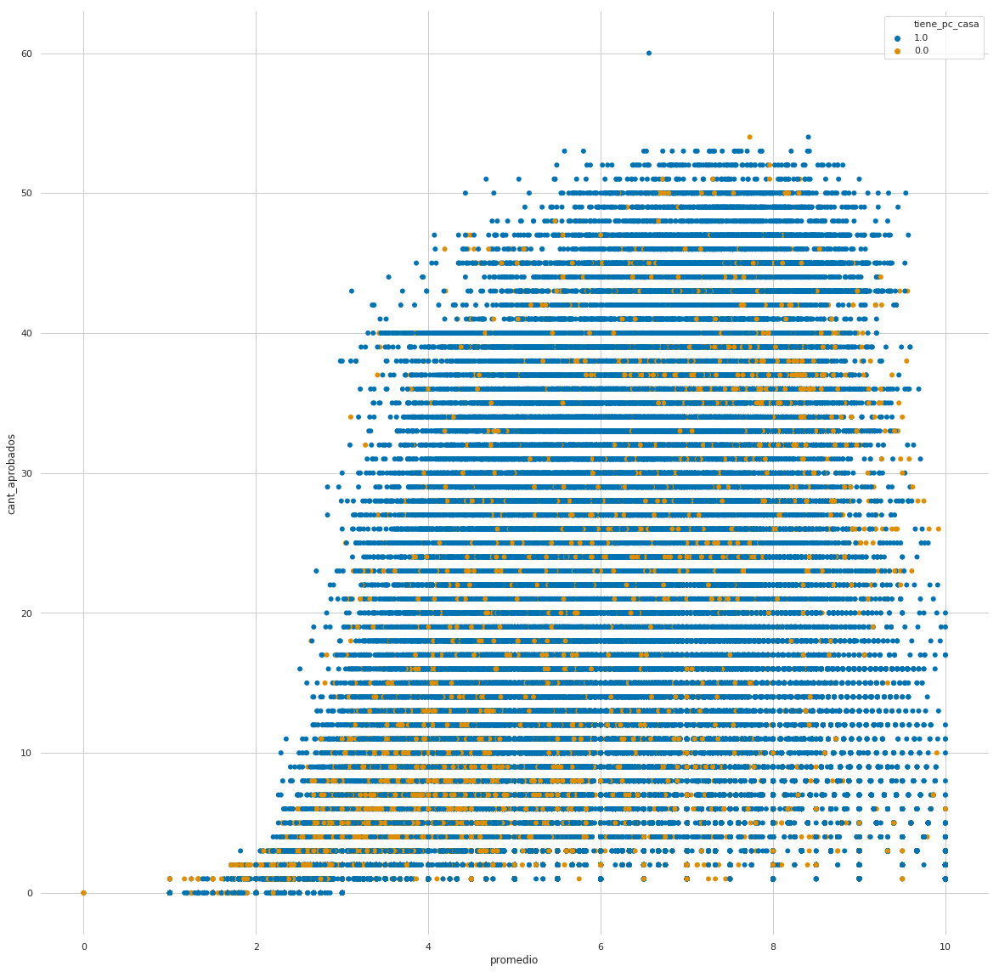

In [63]:
scatter_sns(df,"promedio","cant_aprobados","tiene_pc_casa","scater_cantapr_vs_promedio_tienepc")

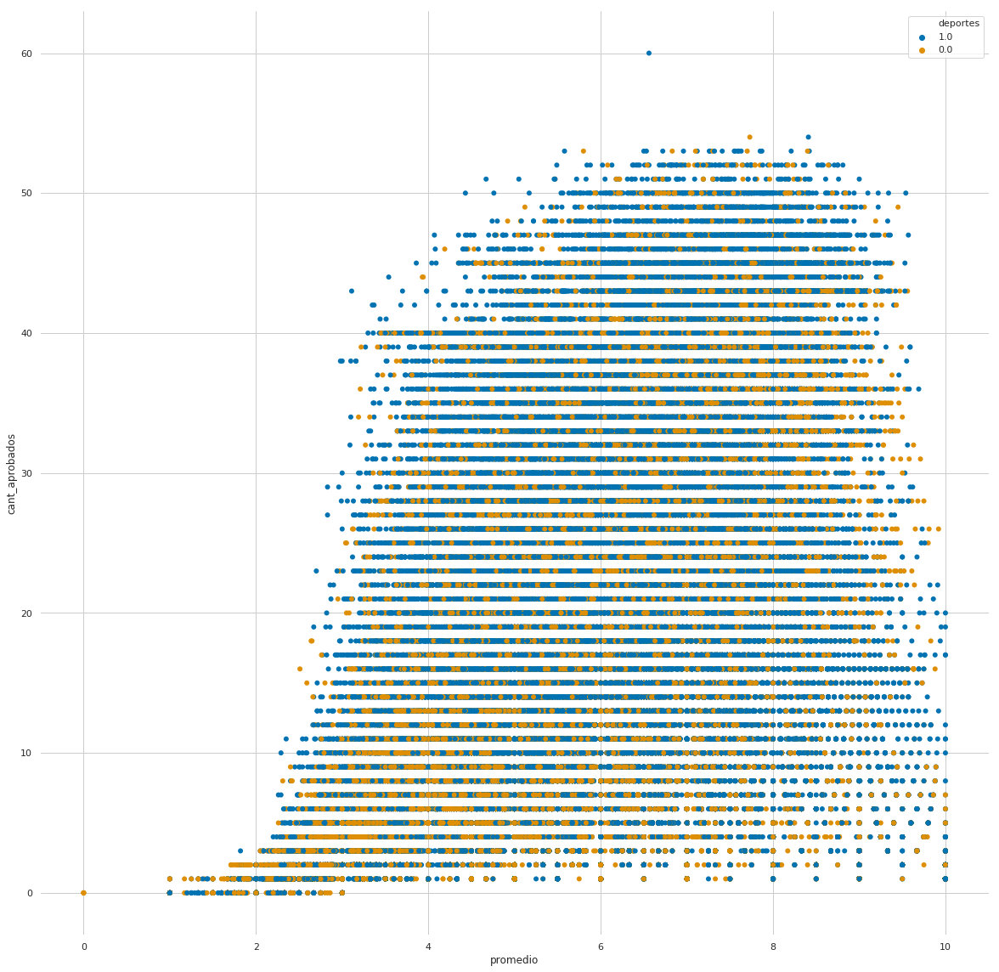

In [66]:
scatter_sns(df,"promedio","cant_aprobados","deportes","scater_cantapr_vs_promedio_deportes")

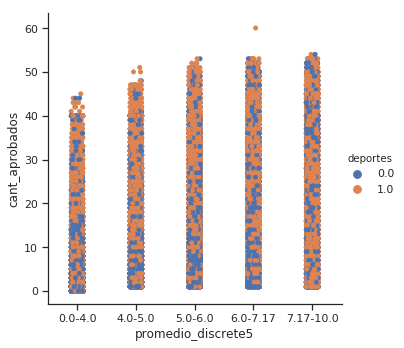

In [65]:
df_scatter = df[['cant_aprobados','promedio_discrete5','deportes','desercion']]
sns.set(style="ticks")
g = sns.catplot(x="promedio_discrete5", y="cant_aprobados", hue="deportes", data=df_scatter)

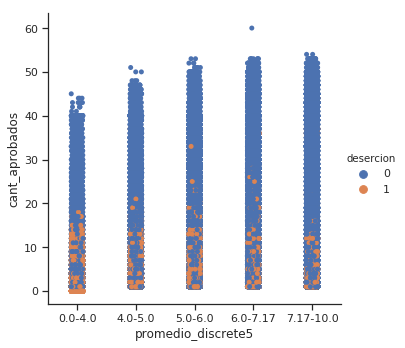

In [52]:
df_scatter = df[['cant_aprobados','promedio_discrete5','tiene_pc_casa','desercion']]
sns.set(style="ticks")
g = sns.catplot(x="promedio_discrete5", y="cant_aprobados", hue="desercion", data=df_scatter)

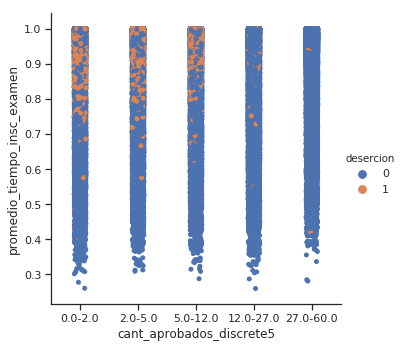

In [53]:
df_scatter = df[['cant_aprobados_discrete5','promedio_tiempo_insc_examen','tiene_pc_casa','desercion']]
sns.set(style="ticks")
g = sns.catplot(x="cant_aprobados_discrete5", y="promedio_tiempo_insc_examen", hue="desercion", data=df_scatter)

In [69]:
df.to_pickle("./df_alumnos.pkl")